# IBM Data Science Capstone Project - Battle of Neighborhoods in Genova

## Part 1: Acquiring the Data

### 1.1 Importing the necessary libraries¶

In [1]:
#installing required libraries
!pip install beautifulsoup4
!pip install folium
!pip install geopy
!pip install pandas
!pip install sklearn
!pip install seaborn

import numpy as np
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from geopy.geocoders import Nominatim  # for converting an address into latitude and longitude values
from geopy.geocoders import ArcGIS

import requests # library to handle requests
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from bs4 import BeautifulSoup

# Matplotlib and associated plotting modules
%matplotlib inline 
%pip install seaborn
%pip install plotly==4.14.3
%pip install holoviews
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import holoviews as hv

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
     |████████████████████████████████| 94 kB 5.8 MB/s  eta 0:00:01
/opt/conda/envs/Python-3

/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
Note: you may need to restart the kernel to use updated packages.
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/dhcrypto.py:16: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
/opt/conda/envs/Python-3.7-OpenCE/lib/python3.7/site-packages/secretstorage/util.py:25: CryptographyDeprecationWarning: int_from_bytes is deprecated, use int.from_bytes instead
  from cryptography.utils import int_from_bytes
     |████████████████████

  Created wheel for bokeh: filename=bokeh-2.3.3-py3-none-any.whl size=11342779 sha256=7fa5b236951bd3319b127ec4f011c99096ccc63097f463ee69bbb2f8d6c917ef
  Stored in directory: /tmp/wsuser/.cache/pip/wheels/57/e3/79/051e58e8a3d9076de99bdd7d68d463289e28c18329933984ff
Successfully built bokeh
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.1.1
    Uninstalling bokeh-2.1.1:
      Successfully uninstalled bokeh-2.1.1
Note: you may need to restart the kernel to use updated packages.
Libraries imported.


### 1.2. Downloading the City Information

In [2]:
def download_city_info(city_url):
    response = requests.get(city_url)
    assert response.status_code == 200  #HTTP 200 OK success status response code indicates that the request has succeeded. 
    return response.text

### 1.3. Converting a City's Data from HTML into a DataFrame¶

In [3]:
def city2df(city_url):

    html_city = download_city_info(city_url)

    soup = BeautifulSoup(html_city, 'html.parser')

    city_table = []
    parser=soup.find_all('table')[3]
    
    for row in parser.find_all('tr'):
        
        if row.th:
            continue
        
        #cell['Municipality'] = row.select('td')[0].text.strip()
        #cell['Population'] = row.select('td')[1].text.split()[0]
        #cell['% of Total Population'] = row.select('td')[1].text.split()[1].strip('(').strip(')')
        td_neigh = row.select('td')[2]
        
        for nbh in [neigh.strip().replace('\xa0[it]','') for neigh in td_neigh.text.split(', ')]:
            cell = {}
            cell['Municipality'] = row.select('td')[0].text.strip()
            cell['Population'] = row.select('td')[1].text.split()[0]
            cell['% of Total Population'] = row.select('td')[1].text.split()[1].strip('(').strip(')')
            cell['Neighborhood'] = nbh
            city_table.append(cell)
        
    df=pd.DataFrame(city_table)
        
    return df

### 1.4. Run the city2df method for acquiring the Genova's data and placing it into a DataFrame

In [5]:
city_url = 'https://en.wikipedia.org/wiki/Genoa' 

df = city2df(city_url)

# Cleanse the data:
df['Neighborhood']=df['Neighborhood'].replace({'Staglieno (Parenzo':'Staglieno',
                                                 'Struppa (Doria':'Struppa'})
df = df.drop([23, 28]).reset_index(drop = True)
df.head()

,Municipality,Population,% of Total Population,Neighborhood
0,Centro-Est,"91,402",15.0%,Prè
1,Centro-Est,"91,402",15.0%,Molo
2,Centro-Est,"91,402",15.0%,Maddalena
3,Centro-Est,"91,402",15.0%,Oregina
4,Centro-Est,"91,402",15.0%,Lagaccio


Since the real estate prices were loaded manually from a pdf file and then saved on a separate csv file, we need to load that csv file in order to incorporate the price per m2 for each municipality.

In [16]:
import os, types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.

if os.environ.get('RUNTIME_ENV_LOCATION_TYPE') == 'external':
    endpoint_af5c39d455f142b7ba2c869b5ab72fdd = 'https://s3.us.cloud-object-storage.appdomain.cloud'
else:
    endpoint_af5c39d455f142b7ba2c869b5ab72fdd = 'https://s3.private.us.cloud-object-storage.appdomain.cloud'

client_af5c39d455f142b7ba2c869b5ab72fdd = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='@hidden_cell',
    ibm_auth_endpoint="@hidden_cell",
    config=Config(signature_version='oauth'),
    endpoint_url=endpoint_@hidden_cell)

body = client_af5c39d455f142b7ba2c869b5ab72fdd.get_object(Bucket='applieddatasciencecapstonefinal-donotdelete-pr-rmcbrwilr9zf9n',Key='GenovaData.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_summary = pd.read_csv(body)
df_summary.head()


,Municipality,Neighbourhoods,Population,% of Total Population,Mean Quotation €/m2 2019
0,Centro-Est,"Prè, Molo, Maddalena, Oregina, Lagaccio, San N...",91402,15.0,1895
1,Centro-Ovest,"Sampierdarena, Belvedere, Campasso, San Bartol...",66626,10.9,1163
2,Bassa Val Bisagno,"San Fruttuoso, Sant'Agata, Marassi, Quezzi, Fe...",78791,12.9,1369
3,Media Val Bisagno,"Staglieno (Parenzo, San Pantaleo), Molassana, ...",58742,9.6,1430
4,Valpolcevera,"Rivarolo, Borzoli Est, Certosa, Teglia, Begato...",62492,10.3,1127


Let's add the mean quotation values we obtained from the csv file to our actual dataframe df.

In [18]:
df['Mean Quotation €/m2 2019'] = [df_summary.loc[df_summary['Municipality'] == mun, 'Mean Quotation €/m2 2019'].iat[0] for mun in df['Municipality']]
df.head()

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019
0,Centro-Est,"91,402",15.0%,Prè,1895
1,Centro-Est,"91,402",15.0%,Molo,1895
2,Centro-Est,"91,402",15.0%,Maddalena,1895
3,Centro-Est,"91,402",15.0%,Oregina,1895
4,Centro-Est,"91,402",15.0%,Lagaccio,1895


## Part 2: Get the latitude and the longitude coordinates of each neighborhood and merge these coordinates with the dataframe df.¶

In [20]:
geolocator = ArcGIS() 

lat_col = []
lon_col = []

for nbh in df['Neighborhood']:
        
    location = geolocator.geocode(nbh + ', Genova, Liguria')
    latitude = location.latitude
    longitude = location.longitude   

    lat_col.append(latitude)
    lon_col.append(longitude)

# Insert the Latitude and Longitude columns to the dataframe df
df['Latitude']  = lat_col
df['Longitude'] = lon_col
df.head()

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,Latitude,Longitude
0,Centro-Est,"91,402",15.0%,Prè,1895,44.414615,8.924991
1,Centro-Est,"91,402",15.0%,Molo,1895,44.307690,9.341300
2,Centro-Est,"91,402",15.0%,Maddalena,1895,44.410290,8.933340
3,Centro-Est,"91,402",15.0%,Oregina,1895,44.420400,8.922152
4,Centro-Est,"91,402",15.0%,Lagaccio,1895,44.426370,8.917240


## Part 3: Exploring the Neighborhoods in Genova¶

### 3.1 Getting to Know Genova: Municipalities and Neighborhoods

In [21]:
print('The dataframe has {} municipalities and {} neighborhoods.'.format(len(df['Municipality'].unique()), df.shape[0]))

The dataframe has 9 municipalities and 69 neighborhoods.


In [22]:
df['Municipality'].value_counts()

Levante              11
Centro-Est           10
Valpolcevera          9
Ponente               8
Medio Levante         8
Bassa Val Bisagno     6
Medio Ponente         6
Centro-Ovest          6
Media Val Bisagno     5
Name: Municipality, dtype: int64

Use ArcGIS API geopy library to get the latitude and longitude values of Genova just like we did for getting the coordinates of the neighborhoods.

In [23]:
location = geolocator.geocode('Genova, Liguria')
GE_latitude = location.latitude
GE_longitude = location.longitude   

print('The geograpical coordinates of Genova are {}, {}.'.format(GE_latitude, GE_longitude))

The geograpical coordinates of Genova are 44.41039000000006, 8.938980000000072.


Create a map of Genova with neighborhoods superimposed on top.

In [24]:
# create map of Genova using latitude and longitude values
map_genova = folium.Map(location=[GE_latitude, GE_longitude], zoom_start=11)

# add markers to map
for lat, lng, municipality, neighborhood in zip(df['Latitude'], df['Longitude'], df['Municipality'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, municipality)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_genova)  
    
map_genova

### Hand Engineering

After taking a quick look at the geolocation data, there are some mismatches due to some name similarities of the neighborhoods having multiple occurrences in Genova. The wrong information was corrected by hand within the context of data cleansing as follows:

In [25]:
df.loc[df.Neighborhood == 'Belvedere', 'Latitude'] = 44.41278
df.loc[df.Neighborhood == 'Belvedere', 'Longitude'] = 8.93302

df.loc[df.Neighborhood == 'Molo', 'Latitude'] = 44.4067775
df.loc[df.Neighborhood == 'Molo', 'Longitude'] = 8.9280807

df.loc[df.Neighborhood == 'Manin', 'Latitude'] = 44.4138758
df.loc[df.Neighborhood == 'Manin', 'Longitude'] = 8.9449623

df.loc[df.Neighborhood == 'Forte Quezzi', 'Latitude'] = 44.4266673
df.loc[df.Neighborhood == 'Forte Quezzi', 'Longitude'] = 8.9614216

df.loc[df.Neighborhood == 'San Nicola', 'Latitude'] = 44.4201618
df.loc[df.Neighborhood == 'San Nicola', 'Longitude'] = 8.9296763

df.loc[df.Neighborhood == 'Castagna', 'Latitude'] = 44.4021841
df.loc[df.Neighborhood == 'Castagna', 'Longitude'] = 9.0169858

df.loc[df.Neighborhood == 'Quezzi', 'Latitude'] = 44.4250354
df.loc[df.Neighborhood == 'Quezzi', 'Longitude'] = 8.9718812

df.loc[df.Neighborhood == 'San Fruttuoso', 'Latitude'] = 44.4155581 
df.loc[df.Neighborhood == 'San Fruttuoso', 'Longitude'] = 8.9468308

df.loc[df.Neighborhood == 'Lido', 'Latitude'] = 44.3982199
df.loc[df.Neighborhood == 'Lido', 'Longitude'] = 8.9504026

df.loc[df.Neighborhood == 'San Quirico', 'Latitude'] = 44.4867254
df.loc[df.Neighborhood == 'San Quirico', 'Longitude'] = 8.8898712

df.loc[df.Neighborhood == 'San Bartolomeo', 'Municipality'] = 'Levante' 
df.loc[df.Neighborhood == 'San Bartolomeo', 'Population'] = '66,155' 
df.loc[df.Neighborhood == 'San Bartolomeo', '% of Total Population'] = '10.8%'
df.loc[df.Neighborhood == 'San Bartolomeo', 'Mean Quotation €/m2 2019'] = 3762

df.loc[df.Neighborhood == 'Sturla', 'Latitude'] = 44.3963796
df.loc[df.Neighborhood == 'Sturla', 'Longitude'] = 8.978307

df.loc[df.Neighborhood == 'Marassi', 'Latitude'] = 44.4203991
df.loc[df.Neighborhood == 'Marassi', 'Longitude'] = 8.9585995

df.loc[df.Neighborhood == "Ca' Nuova", 'Latitude'] = 44.4356333
df.loc[df.Neighborhood == "Ca' Nuova", 'Longitude'] = 8.7555861

df.head()

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,Latitude,Longitude
0,Centro-Est,"91,402",15.0%,Prè,1895,44.414615,8.924991
1,Centro-Est,"91,402",15.0%,Molo,1895,44.406777,8.928081
2,Centro-Est,"91,402",15.0%,Maddalena,1895,44.410290,8.933340
3,Centro-Est,"91,402",15.0%,Oregina,1895,44.420400,8.922152
4,Centro-Est,"91,402",15.0%,Lagaccio,1895,44.426370,8.917240


In [26]:
# Update the map of Genova with the correct coordinates The colors of each neighborhoods denotes the municipality it's belonging to.
map_genova = folium.Map(location=[GE_latitude, GE_longitude], zoom_start=11)

# set color scheme for the clusters
num_mun = len(df['Municipality'].unique())
x = np.arange(num_mun)
ys = [i + x + (i*x)**2 for i in range(num_mun)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
color_dict = dict(zip(df['Municipality'].unique(), rainbow))

# add markers to map
for lat, lng, municipality, neighborhood in zip(df['Latitude'], df['Longitude'], df['Municipality'], df['Neighborhood']):
    label = '{}, {}'.format(neighborhood, municipality)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=color_dict[municipality],
        fill=True,
        fill_color='black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_genova)  
    
map_genova

### 3.3 Making Use of Foursquare

Define Foursquare Credentials and Version

In [27]:
# @hidden_cell
CLIENT_ID = 'XXXX' # your Foursquare ID
CLIENT_SECRET = 'XXXX' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

### 3.4 Explore the Neighborhoods in Genova


Create a function to explore the venues for all the neighborhoods in Genova

In [28]:
def getNearbyVenues(mun_names, ngh_names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for mun, ngh, lat, lng in zip(mun_names, ngh_names, latitudes, longitudes):
        # print(name)
            
        # create the API request URL
        url = ('https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}').format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            mun,
            ngh, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Municipality',
                  'Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Get the venues for all the neighborhoods in Genova.

In [29]:
genova_venues = getNearbyVenues(df['Municipality'], df['Neighborhood'], df['Latitude'], df['Longitude'])

print(genova_venues.shape)
genova_venues.head(10)

(773, 8)


,Municipality,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Centro-Est,Prè,44.414615,8.924991,Trattoria dell'Acciughetta,44.414603,8.924658,Trattoria/Osteria
1,Centro-Est,Prè,44.414615,8.924991,Sommergibile Nazario Sauro,44.414077,8.924242,Boat or Ferry
2,Centro-Est,Prè,44.414615,8.924991,I 2 Truogoli,44.415413,8.924814,Diner
3,Centro-Est,Prè,44.414615,8.924991,Galata Museo del Mare,44.414149,8.923971,Science Museum
4,Centro-Est,Prè,44.414615,8.924991,Ristorante Beluga,44.414449,8.922484,Seafood Restaurant
5,Centro-Est,Prè,44.414615,8.924991,Osteria Carabàs,44.415809,8.924995,Italian Restaurant
6,Centro-Est,Prè,44.414615,8.924991,Grand Hotel Savoia,44.417008,8.923041,Hotel
7,Centro-Est,Prè,44.414615,8.924991,Caffè Il Gelato,44.412408,8.926615,Ice Cream Shop
8,Centro-Est,Prè,44.414615,8.924991,Ristorante Soho,44.411909,8.928644,Seafood Restaurant
9,Centro-Est,Prè,44.414615,8.924991,Piazza della Nunziata,44.413660,8.928604,Plaza


The number of unique categories that can be curated from all the returned venues:

In [30]:
print('There are {} unique categories.'.format(len(genova_venues['Venue Category'].unique())))
print('There are {} venues.'.format(genova_venues.shape[0]))

There are 145 unique categories.
There are 773 venues.


In order to understand which type of venues are more popular in the city, we will sort the venue categories.

In [31]:
venuenum_ctg = (genova_venues.groupby('Venue Category').count()).loc[:, 'Venue'].sort_values(ascending= False)
venuenum_ctg.head()

Venue Category
Italian Restaurant    67
Plaza                 58
Café                  41
Pizza Place           39
Hotel                 35
Name: Venue, dtype: int64

Text(0.5, 0, '25 Most Popular Venue Categories')

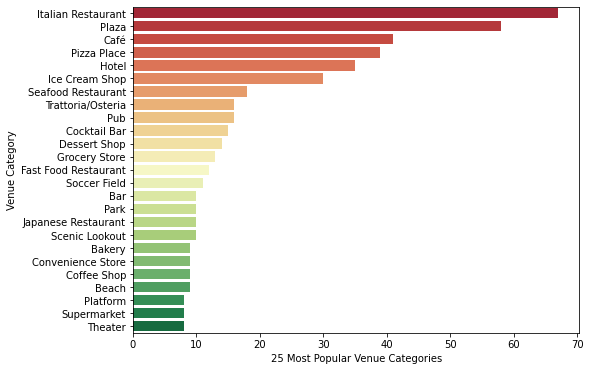

In [32]:
plt.figure(figsize=(8, 6))
f = sns.barplot(x=venuenum_ctg.values[:25], y=venuenum_ctg.index[:25], palette="RdYlGn")
plt.xlabel('25 Most Popular Venue Categories')

Let's check how many venues were returned for each neighborhood in descending order.

Text(0.5, 0, 'Number of Venues in Each Municipality')

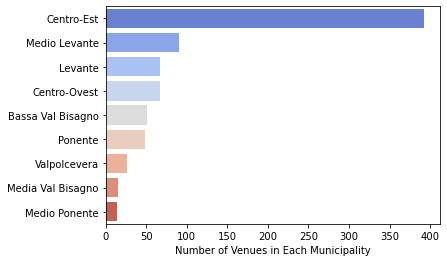

In [33]:
venue_nums = (genova_venues.groupby('Municipality').count()).loc[:, 'Venue'].sort_values(ascending= False)
venue_nums.to_frame()
muns = list(venue_nums.index)
venuenum = list(venue_nums.values)
f = sns.barplot(x=venue_nums, y=muns, palette="coolwarm")
plt.xlabel('Number of Venues in Each Municipality')

Let's add the number of venues to our summary data frame, df_summary, to be used later in the analysis.

In [34]:
df_summary['Number of Venues'] = [venue_nums[mun] for mun in df_summary['Municipality']]
df_summary

,Municipality,Neighbourhoods,Population,% of Total Population,Mean Quotation €/m2 2019,Number of Venues
0,Centro-Est,"Prè, Molo, Maddalena, Oregina, Lagaccio, San N...",91402,15.0,1895,393
1,Centro-Ovest,"Sampierdarena, Belvedere, Campasso, San Bartol...",66626,10.9,1163,67
2,Bassa Val Bisagno,"San Fruttuoso, Sant'Agata, Marassi, Quezzi, Fe...",78791,12.9,1369,51
3,Media Val Bisagno,"Staglieno (Parenzo, San Pantaleo), Molassana, ...",58742,9.6,1430,15
4,Valpolcevera,"Rivarolo, Borzoli Est, Certosa, Teglia, Begato...",62492,10.3,1127,26
5,Medio Ponente,"Sestri, Borzoli Ovest, San Giovanni Battista, ...",61810,10.1,2059,14
6,Ponente,"Voltri, Crevari, Pra', Palmaro, Ca' Nuova, Peg...",63027,10.3,2028,49
7,Medio Levante,"Foce, Brignole, San Martino, Chiappeto, Albaro...",61759,10.1,2680,91
8,Levante,"Sturla, Quarto, Quartara, Castagna, Quinto al ...",66155,10.8,3762,67


### 3.5 Visualizations of the Distributions of the Venue Categories with respect to Neighborhoods and Municipalities

Let's get the distribution of the venues in each municipality and visualize this by using a Sankey Diagram.

In [35]:
mun_dist = (genova_venues.groupby(['Municipality', 'Venue Category']).count()).sort_values(by = ['Municipality', 'Venue'], ascending= False).reset_index()
mun_dist.head(30)

,Municipality,Venue Category,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
0,Valpolcevera,Soccer Field,6,6,6,6,6,6
1,Valpolcevera,Construction & Landscaping,2,2,2,2,2,2
2,Valpolcevera,Burger Joint,1,1,1,1,1,1
3,Valpolcevera,Café,1,1,1,1,1,1
4,Valpolcevera,Coffee Shop,1,1,1,1,1,1
5,Valpolcevera,Dessert Shop,1,1,1,1,1,1
6,Valpolcevera,Diner,1,1,1,1,1,1
7,Valpolcevera,Dog Run,1,1,1,1,1,1
8,Valpolcevera,Food & Drink Shop,1,1,1,1,1,1
9,Valpolcevera,Gym Pool,1,1,1,1,1,1


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
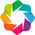

:Sankey   [Municipality,Venue Category]   (Venue Latitude)

In [36]:
hv.extension('bokeh')
skmundist1 = hv.Sankey(mun_dist.loc[:, mun_dist.columns[[0]+[1]+[6]]])
skmundist1.opts(
                                 edge_color='Venue Category', edge_line_width=0,
                                 node_alpha=0.8, node_width=40, node_sort=True,
                                 width=600, height=1000, bgcolor="snow",
                                 title="Distribution of Venues in Each Municipality")

Here is the tabular representation of the distribution of the venue types in each neighborhood and municipality.

In [37]:
venuenum_ngh = (genova_venues.groupby(['Municipality', 'Neighborhood']).count())
# Sanity Check
tot = venuenum_ngh.groupby(['Municipality']).sum()
tot['Venue']

Municipality
Bassa Val Bisagno     51
Centro-Est           393
Centro-Ovest          67
Levante               67
Media Val Bisagno     15
Medio Levante         91
Medio Ponente         14
Ponente               49
Valpolcevera          26
Name: Venue, dtype: int64

In [38]:
(venuenum_ngh['Venue']).to_frame()

Venue
Municipality      Neighborhood                
Bassa Val Bisagno Fereggiano                12
                  Forte Quezzi               2
                  Marassi                    4
                  Quezzi                     4
                  San Fruttuoso             13
                  Sant'Agata                16
Centro-Est        Carignano                 33
                  Castelletto                4
                  Lagaccio                   4
                  Maddalena                 94
                  Manin                      9
                  Molo                     100
                  Oregina                   22
                  Prè                       42
                  San Nicola                 6
                  San Vincenzo              79
Centro-Ovest      Angeli                     4
                  Belvedere                 39
                  Campasso                   4
                  Sampierdarena             15
                  San Teodoro                5
Levante           Apparizione                2
                  Bavari                     1
                  Borgoratti                 6
                  Nervi                     12
                  Quartara                   6
                  Quarto                     8
                  Quinto al Mare             8
                  San Bartolomeo             8
                  San Desiderio              3
                  Sant'Ilario                5
                  Sturla                     8
Media Val Bisagno Molassana                  4
                  Montesignano               5
                  Sant'Eusebio               4
                  Staglieno                  2
Medio Levante     Albaro                    10
                  Chiappeto                  2
                  Foce                      26
                  Lido                      18
                  Puggia                     5
                  San Giuliano              22
                  San Martino                8
Medio Ponente     Borzoli Ovest              3
                  Calcinara,                 3
                  Campi                      1
                  Cornigliano                2
                  San Giovanni Battista      4
                  Sestri                     1
Ponente           Castelluccio               5
                  Crevari                    3
                  Multedo                    4
                  Palmaro                    4
                  Pegli                     14
                  Pra'                       5
                  Voltri                    14
Valpolcevera      Bolzaneto                  4
                  Borzoli Est                3
                  Certosa                    5
                  Pontedecimo                4
                  Rivarolo                   5
                  Teglia                     5

In [39]:
print('There are {} neighborhoods out of {} with venues.'.format(venuenum_ngh.shape[0], df['Neighborhood'].count()))

There are 62 neighborhoods out of 69 with venues.


In order to get a visual representation of the distribution of the venue types with respect to neighborhoods and municipalities, we need to prepare the data for the Sankey Diagram.

In [40]:
mun_dist2 = (genova_venues.groupby(['Municipality', 'Neighborhood']).count()).sort_values(by = ['Municipality', 'Neighborhood'], ascending= False).reset_index()
mun_dist2.head(10)

,Municipality,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Valpolcevera,Teglia,5,5,5,5,5,5
1,Valpolcevera,Rivarolo,5,5,5,5,5,5
2,Valpolcevera,Pontedecimo,4,4,4,4,4,4
3,Valpolcevera,Certosa,5,5,5,5,5,5
4,Valpolcevera,Borzoli Est,3,3,3,3,3,3
5,Valpolcevera,Bolzaneto,4,4,4,4,4,4
6,Ponente,Voltri,14,14,14,14,14,14
7,Ponente,Pra',5,5,5,5,5,5
8,Ponente,Pegli,14,14,14,14,14,14
9,Ponente,Palmaro,4,4,4,4,4,4


In [41]:
mun_dist3 = (genova_venues.groupby(['Neighborhood', 'Venue Category']).count()).sort_values(by = ['Neighborhood', 'Venue Category'], ascending= False).reset_index()
mun_dist3.head(12)

,Neighborhood,Venue Category,Municipality,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
0,Voltri,Trattoria/Osteria,1,1,1,1,1,1
1,Voltri,Theater,1,1,1,1,1,1
2,Voltri,Supermarket,1,1,1,1,1,1
3,Voltri,Seafood Restaurant,2,2,2,2,2,2
4,Voltri,Scenic Lookout,1,1,1,1,1,1
5,Voltri,Pizza Place,1,1,1,1,1,1
6,Voltri,Pharmacy,1,1,1,1,1,1
7,Voltri,Park,1,1,1,1,1,1
8,Voltri,Food Court,1,1,1,1,1,1
9,Voltri,Café,2,2,2,2,2,2


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
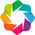

:Sankey   [Source,Target]   (Values)

In [42]:
src = list(mun_dist2['Municipality'])+list(mun_dist3['Neighborhood'])
trg = list(mun_dist2['Neighborhood'])+list(mun_dist3['Venue Category'])
val = list(mun_dist2['Venue'])+list(mun_dist3['Venue'])

tempdata = {'Source': src, 'Target': trg, 'Values': val}

muntot = pd.DataFrame(tempdata, columns = ['Source', 'Target', 'Values'])

hv.extension('bokeh')
sktot = hv.Sankey(muntot)
sktot.opts(
                                 edge_color='Target', edge_line_width=0,
                                 node_alpha=0.8, node_width=40, node_sort=True,
                                 width=800, height=1000, bgcolor="snow",
                                 title="Distribution of the Venue Types with Respect to Neighborhoods and Municipalities in Genova")

#### As there are too many venue categories among which many venues are the only examples of their categories, it is better to restrict the venue categories to 40 for getting a clearer understanding



In [43]:
venuenum_ctg40= pd.DataFrame(venuenum_ctg[:40]).reset_index()
venuenum_ctg40

,Venue Category,Venue
0,Italian Restaurant,67
1,Plaza,58
2,Café,41
3,Pizza Place,39
4,Hotel,35
5,Ice Cream Shop,30
6,Seafood Restaurant,18
7,Trattoria/Osteria,16
8,Pub,16
9,Cocktail Bar,15


In [44]:
# Making a separate column for filtering out the venues that are not in top 40. 
genova_venues['Venue Category2'] = [cat if cat in venuenum_ctg40['Venue Category'].values else 'Other' for cat in genova_venues['Venue Category']]
genova_venues.head(10)

,Municipality,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category2
0,Centro-Est,Prè,44.414615,8.924991,Trattoria dell'Acciughetta,44.414603,8.924658,Trattoria/Osteria,Trattoria/Osteria
1,Centro-Est,Prè,44.414615,8.924991,Sommergibile Nazario Sauro,44.414077,8.924242,Boat or Ferry,Boat or Ferry
2,Centro-Est,Prè,44.414615,8.924991,I 2 Truogoli,44.415413,8.924814,Diner,Other
3,Centro-Est,Prè,44.414615,8.924991,Galata Museo del Mare,44.414149,8.923971,Science Museum,Other
4,Centro-Est,Prè,44.414615,8.924991,Ristorante Beluga,44.414449,8.922484,Seafood Restaurant,Seafood Restaurant
5,Centro-Est,Prè,44.414615,8.924991,Osteria Carabàs,44.415809,8.924995,Italian Restaurant,Italian Restaurant
6,Centro-Est,Prè,44.414615,8.924991,Grand Hotel Savoia,44.417008,8.923041,Hotel,Hotel
7,Centro-Est,Prè,44.414615,8.924991,Caffè Il Gelato,44.412408,8.926615,Ice Cream Shop,Ice Cream Shop
8,Centro-Est,Prè,44.414615,8.924991,Ristorante Soho,44.411909,8.928644,Seafood Restaurant,Seafood Restaurant
9,Centro-Est,Prè,44.414615,8.924991,Piazza della Nunziata,44.413660,8.928604,Plaza,Plaza


Let's simplify our dataset restricting the venues to get the ones in the top 40 venue categories:

In [45]:
genova_venues_cat40 = genova_venues[genova_venues['Venue Category2'] != 'Other']
print('There are {} unique categories.'.format(len(genova_venues_cat40['Venue Category'].unique())))
print('There are {} venues in the top 40 venue categories.'.format(genova_venues_cat40.shape[0]))

There are 40 unique categories.
There are 573 venues in the top 40 venue categories.


In [46]:
dist_cat40 = (genova_venues_cat40.groupby(['Municipality', 'Neighborhood', 'Venue Category']).count()).sort_values(by = ['Municipality', 'Neighborhood'], ascending= False).reset_index()
dist_cat40.head(20)

,Municipality,Neighborhood,Venue Category,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category2
0,Valpolcevera,Teglia,Shopping Mall,1,1,1,1,1,1
1,Valpolcevera,Teglia,Soccer Field,1,1,1,1,1,1
2,Valpolcevera,Rivarolo,Soccer Field,3,3,3,3,3,3
3,Valpolcevera,Pontedecimo,Burger Joint,1,1,1,1,1,1
4,Valpolcevera,Pontedecimo,Dessert Shop,1,1,1,1,1,1
5,Valpolcevera,Pontedecimo,Soccer Field,1,1,1,1,1,1
6,Valpolcevera,Certosa,Café,1,1,1,1,1,1
7,Valpolcevera,Borzoli Est,Soccer Field,1,1,1,1,1,1
8,Valpolcevera,Bolzaneto,Coffee Shop,1,1,1,1,1,1
9,Valpolcevera,Bolzaneto,Theater,1,1,1,1,1,1


In [47]:
mun_dist2_40 = (genova_venues_cat40.groupby(['Municipality', 'Neighborhood']).count()).sort_values(by = ['Municipality', 'Neighborhood'], ascending= False).reset_index()

mun_dist2_40 = mun_dist2_40[['Municipality', 'Neighborhood', 'Venue']]

In [48]:
mun_dist3_40 = (genova_venues_cat40.groupby(['Neighborhood', 'Venue Category']).count()).sort_values(by = ['Neighborhood', 'Venue Category'], ascending= False).reset_index()

mun_dist3_40 = mun_dist3_40[['Neighborhood', 'Venue Category', 'Venue']]

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
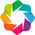

:Sankey   [Source,Target]   (Values)

In [49]:
src40 = list(mun_dist2_40['Municipality'])+list(mun_dist3_40['Neighborhood'])
trg40 = list(mun_dist2_40['Neighborhood'])+list(mun_dist3_40['Venue Category'])
val40 = list(mun_dist2_40['Venue'])+list(mun_dist3_40['Venue'])

tempdata = {'Source': src40, 'Target': trg40, 'Values': val40}

muntot = pd.DataFrame(tempdata, columns = ['Source', 'Target', 'Values'])

hv.extension('bokeh')
sktot = hv.Sankey(muntot)
sktot.opts(
                                 edge_color='Target', edge_line_width=0,
                                 node_alpha=0.8, node_width=40, node_sort=True,
                                 width=800, height=1000, bgcolor="snow",
                                 title="Venue Category Distribution at Genova for top 40 Categories")

### 3.6 Analyze Each Neighborhood

In [50]:
(genova_venues.groupby('Neighborhood').count()).loc[:, 'Venue Category'].sort_values(ascending= False).to_frame()

,Venue Category
Neighborhood,
Molo,100
Maddalena,94
San Vincenzo,79
Prè,42
Belvedere,39
Carignano,33
Foce,26
San Giuliano,22
Oregina,22


In [51]:
# one hot encoding
genova_onehot = pd.get_dummies(genova_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
genova_onehot['Neighborhood'] = genova_venues['Neighborhood'] 

# Find in which column of the dataframe is 'Neighborhood'
neigh_ind = list(genova_onehot.columns).index('Neighborhood')

# move neighborhood column to the first column
fixed_columns = [genova_onehot.columns[neigh_ind]] + list(genova_onehot.columns[:neigh_ind]) + list(genova_onehot.columns[neigh_ind+1:])
                                                            
genova_onehot = genova_onehot[fixed_columns]

genova_onehot.head()

,Neighborhood,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bakery,Bar,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Betting Shop,Big Box Store,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Bridge,Burger Joint,Bus Station,Cable Car,Café,Chinese Restaurant,City,Clothing Store,Cocktail Bar,Coffee Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Distribution Center,Dog Run,Eastern European Restaurant,Electronics Store,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Food,Food & Drink Shop,Food Court,French Restaurant,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hostel,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Ligurian Restaurant,Lingerie Store,Lounge,Mac & Cheese Joint,Mattress Store,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Motorcycle Shop,Mountain,Movie Theater,Museum,Music Venue,Nightclub,Office,Opera House,Optical Shop,Other Nightlife,Outdoors & Recreation,Park,Performing Arts Venue,Pharmacy,Piadineria,Pier,Pizza Place,Platform,Playground,Plaza,Pool,Pub,Racetrack,Restaurant,Road,Rock Club,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shopping Mall,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Tapas Restaurant,Tennis Court,Tennis Stadium,Theater,Toll Booth,Toy / Game Store,Trail,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Water Park,Wine Bar,Wine Shop,Zoo Exhibit
0,Prè,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,Prè,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Prè,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Prè,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Prè,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Let's check the new dataframe size:

In [52]:
genova_onehot.shape

(773, 146)

Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category. What this actually does is that, for each neighborhood, we divide the number of venues in each category to the total number of venues in that neighborhood. For example, there is 1 bar in Albaro out of 10 venues. Hence, the frequency of it in the table below is 1/10 = 0.1.

In [53]:
genova_grouped = genova_onehot.groupby('Neighborhood').mean().reset_index()
genova_grouped.head()

,Neighborhood,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bakery,Bar,Basketball Court,Beach,Beach Bar,Bed & Breakfast,Betting Shop,Big Box Store,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Bridge,Burger Joint,Bus Station,Cable Car,Café,Chinese Restaurant,City,Clothing Store,Cocktail Bar,Coffee Shop,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cupcake Shop,Department Store,Dessert Shop,Diner,Distribution Center,Dog Run,Eastern European Restaurant,Electronics Store,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Food,Food & Drink Shop,Food Court,French Restaurant,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Harbor / Marina,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Hockey Rink,Home Service,Hostel,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Indie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Ligurian Restaurant,Lingerie Store,Lounge,Mac & Cheese Joint,Mattress Store,Mediterranean Restaurant,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mobile Phone Shop,Motorcycle Shop,Mountain,Movie Theater,Museum,Music Venue,Nightclub,Office,Opera House,Optical Shop,Other Nightlife,Outdoors & Recreation,Park,Performing Arts Venue,Pharmacy,Piadineria,Pier,Pizza Place,Platform,Playground,Plaza,Pool,Pub,Racetrack,Restaurant,Road,Rock Club,Sandwich Place,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shopping Mall,Snack Place,Soccer Field,Soccer Stadium,Soup Place,Sporting Goods Shop,Sports Club,Stadium,Steakhouse,Supermarket,Surf Spot,Sushi Restaurant,Tapas Restaurant,Tennis Court,Tennis Stadium,Theater,Toll Booth,Toy / Game Store,Trail,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Water Park,Wine Bar,Wine Shop,Zoo Exhibit
0,Albaro,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.0,0.0,0.100000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.0,0.000000,0.100000,0.0,0.0,0.0,0.000000,0.0,0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.100000,0.1,0.000000,0.0,0.1,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.2,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Angeli,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.25,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.250000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Apparizione,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.00,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.500000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.500000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.0,0.000000,

In [54]:
print('There are {} neighborhoods and {} venues categories in total.'.format(genova_grouped.shape[0], genova_grouped.shape[1]-1))

There are 62 neighborhoods and 145 venues categories in total.


#### Let's print each neighborhood along with its top 7 most common venue categories.

In [55]:
num_top_venues = 7

for ngh in genova_grouped['Neighborhood']:
    print("----"+ngh+"----")
    temp = genova_grouped[genova_grouped['Neighborhood'] == ngh].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:] # Since the first row contains the name of the neighbourhood, it is removed with this assignment
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Albaro----
            venue  freq
0    Tennis Court   0.2
1  Ice Cream Shop   0.1
2             Bar   0.1
3      Restaurant   0.1
4            Café   0.1
5            Pool   0.1
6             Gym   0.1


----Angeli----
                 venue  freq
0             Boutique  0.25
1         Home Service  0.25
2            Surf Spot  0.25
3                Plaza  0.25
4  Ligurian Restaurant  0.00
5          Music Venue  0.00
6           Playground  0.00


----Apparizione----
                   venue  freq
0     Italian Restaurant   0.5
1         Scenic Lookout   0.5
2               Aquarium   0.0
3  Performing Arts Venue   0.0
4                 Office   0.0
5            Opera House   0.0
6           Optical Shop   0.0


----Bavari----
                   venue  freq
0                    Bar   1.0
1               Aquarium   0.0
2  Performing Arts Venue   0.0
3              Nightclub   0.0
4                 Office   0.0
5            Opera House   0.0
6           Optical Shop   0.0


----Bel

                venue  freq
0  Italian Restaurant  0.11
1               Plaza  0.09
2                Café  0.08
3               Hotel  0.05
4         Coffee Shop  0.05
5        Dessert Shop  0.05
6      Clothing Store  0.04


----Sant'Agata----
                venue  freq
0               Hotel  0.19
1               Plaza  0.12
2     Bed & Breakfast  0.06
3            Platform  0.06
4  Italian Restaurant  0.06
5      Sandwich Place  0.06
6   Convenience Store  0.06


----Sant'Eusebio----
                   venue  freq
0     Italian Restaurant  0.25
1                  Diner  0.25
2                  Plaza  0.25
3       Basketball Court  0.25
4               Aquarium  0.00
5  Performing Arts Venue  0.00
6            Opera House  0.00


----Sant'Ilario----
         venue  freq
0        Hotel   0.2
1          Pub   0.2
2   Playground   0.2
3  Pizza Place   0.2
4        Beach   0.2
5     Aquarium   0.0
6         Park   0.0


----Sestri----
             venue  freq
0         Mountain   1.0
1  

#### 3.7 Final Process Before Clustering

First, let's write a function to sort the venues in descending order.

In [56]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [57]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = genova_grouped['Neighborhood']

for ind in np.arange(genova_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(genova_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Albaro,Tennis Court,Ice Cream Shop,Bar,Ligurian Restaurant,Gym,Pool,Restaurant,Café,Plaza,Basketball Court
1,Angeli,Plaza,Home Service,Surf Spot,Boutique,Farmers Market,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food
2,Apparizione,Scenic Lookout,Italian Restaurant,Falafel Restaurant,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant,Farmers Market
3,Bavari,Bar,Zoo Exhibit,Fast Food Restaurant,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Farmers Market
4,Belvedere,Plaza,Café,Italian Restaurant,Hotel,Cocktail Bar,Ice Cream Shop,Seafood Restaurant,Fast Food Restaurant,Hostel,Museum
5,Bolzaneto,Theater,Coffee Shop,Train Station,Toy / Game Store,Falafel Restaurant,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food
6,Borgoratti,Health Food Store,Pizza Place,Food Court,Food & Drink Shop,Cocktail Bar,Café,Fast Food Restaurant,Furniture / Home Store,French Restaurant,Food
7,Borzoli Est,Construction & Landscaping,Soccer Field,Rock Club,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant
8,Borzoli Ovest,Construction & Landscaping,Soccer Field,Rock Club,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant
9,"Calcinara,",Plaza,Italian Restaurant,Mountain,Fast Food Restaurant,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food


## 4. Cluster Neighborhoods

Run K-means to cluster the neighborhood.

Text(0, 0.5, 'Sum of Squared Error')

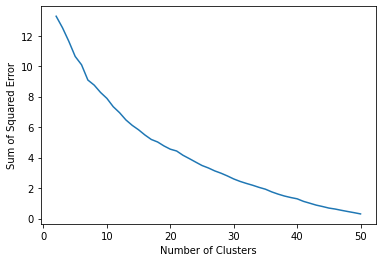

In [58]:
from sklearn.metrics import silhouette_samples, silhouette_score

# set the maximum number of clusters
max_kclusters = 50

# performance metrics
SSE = [] #sum of squared error
no_of_clusters = []
silhouette_scores = []

# Drop the column with neighborhood names as it cannot be used in clustering.
genova_grouped_clustering = genova_grouped.drop('Neighborhood', 1)

for kclusters in range(2, max_kclusters+1):
    # run k-means clustering
    kmeans  = KMeans(init = "k-means++", n_clusters=kclusters, random_state=0).fit(genova_grouped_clustering)
    kmeans2 = KMeans(n_clusters=kclusters, init = 'k-means++', random_state=0).fit_predict(genova_grouped_clustering)

    SSE.append(kmeans.inertia_)
    score = silhouette_score(genova_grouped_clustering, kmeans2)
    silhouette_scores.append(score)
    no_of_clusters.append(kclusters)
    
    
plt.plot(no_of_clusters, SSE)
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of Squared Error')

Looking at the sum of squared error of K-Means clustering, there is not a clear elbow point. Given that there are 63 neighborhoods used in the analyses, choosing a high cluster size would obviously reduce the error, since many of the clusters would have only 1 member. However, this makes the idea of clustering a bit useless in a case where the number of clusters is close to the number of neighborhoods. For this reason, we should use Silhouette Score to measure the goodness of our clustering.

The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1.

The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values generally indicate that a sample has been assigned to the wrong cluster, as a different cluster is more similar. The Silhouette Coefficient is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those obtained through DBSCAN.

Text(0, 0.5, 'Silhouette Scores')

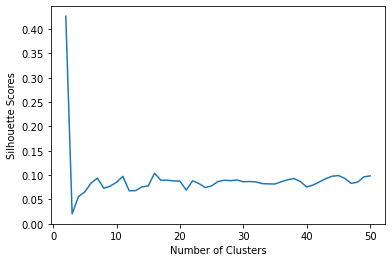

In [59]:
plt.plot(no_of_clusters, silhouette_scores)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Scores')

In [60]:
silhouette_scores

[0.42620047807039435,
 0.020166319213270383,
 0.055881690094634624,
 0.06540270816082128,
 0.083874111448877,
 0.09364086126021623,
 0.0727972274570826,
 0.07728315329335257,
 0.08512132295386297,
 0.09738220369956713,
 0.06766805284338069,
 0.06797704231805166,
 0.07565491955005976,
 0.07768961322205972,
 0.10371507915970889,
 0.08938306650134552,
 0.08952083501191956,
 0.08797577117958025,
 0.08738025900757489,
 0.06918826548728059,
 0.08810734607813435,
 0.08253084724734204,
 0.07420832209739471,
 0.07779834384041523,
 0.08681546012741877,
 0.08933114516779211,
 0.08847046124381475,
 0.089857972873237,
 0.08611516294713395,
 0.08681073720831047,
 0.0857876233907339,
 0.08237001011245909,
 0.08187349630899454,
 0.08159260997530576,
 0.08635429074241377,
 0.09048080739193817,
 0.09272696729230225,
 0.08657334580250409,
 0.07548759656875535,
 0.07957876054188288,
 0.08603846405917223,
 0.09253711174241273,
 0.09758144663249427,
 0.09910009758592445,
 0.09306798296890188,
 0.08300393371

Looking at silhouette scores of K-Means clustering, selecting the number of clusters as 8 would be a good choice.

In [61]:
# set number of clusters
kclusters = 8

# Drop the column with neighborhood names as it cannot be used in clustering.
genova_grouped_clustering = genova_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(genova_grouped_clustering)
  
# check cluster labels generated for each row in the dataframe
kmeans.labels_

array([1, 1, 1, 2, 1, 1, 5, 0, 0, 1, 5, 4, 1, 5, 1, 1, 6, 7, 1, 5, 1, 1,
       5, 5, 1, 1, 5, 5, 1, 1, 1, 1, 1, 5, 5, 1, 1, 1, 5, 1, 5, 1, 5, 0,
       5, 1, 1, 1, 1, 1, 5, 1, 1, 1, 1, 1, 5, 3, 1, 1, 5, 1], dtype=int32)

Let's create a new dataframe that includes the cluster that we created in Section 3.2 joining the top 10 venues for each neighborhood.

In [62]:
# add clustering labels as the very first column
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

genova_merged = df

# merge genova_grouped with df to add latitude/longitude for each neighborhood
genova_merged = genova_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

genova_merged

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Centro-Est,"91,402",15.0%,Prè,1895,44.414615,8.924991,1.0,Hotel,Italian Restaurant,Seafood Restaurant,Boat or Ferry,Trattoria/Osteria,Ice Cream Shop,Plaza,Café,Platform,History Museum
1,Centro-Est,"91,402",15.0%,Molo,1895,44.406777,8.928081,1.0,Italian Restaurant,Plaza,Café,Pub,Ice Cream Shop,Trattoria/Osteria,Fast Food Restaurant,Pizza Place,Steakhouse,Bar
2,Centro-Est,"91,402",15.0%,Maddalena,1895,44.410290,8.933340,1.0,Italian Restaurant,Plaza,Café,Ice Cream Shop,Fast Food Restaurant,Pub,Coffee Shop,Dessert Shop,Hotel,Burger Joint
3,Centro-Est,"91,402",15.0%,Oregina,1895,44.420400,8.922152,1.0,Hotel,Café,Platform,Trattoria/Osteria,Outdoors & Recreation,Ice Cream Shop,Plaza,Sandwich Place,Falafel Restaurant,Italian Restaurant
4,Centro-Est,"91,402",15.0%,Lagaccio,1895,44.426370,8.917240,5.0,Pizza Place,Hockey Rink,Soccer Field,Supermarket,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food
5,Centro-Est,"91,402",15.0%,San Nicola,1895,44.420162,8.929676,1.0,Garden,Pizza Place,History Museum,Italian Restaurant,Road,Outdoors & Recreation,Farmers Market,French Restaurant,Food Court,Food & Drink Shop
6,Centro-Est,"91,402",15.0%,Castelletto,1895,44.417770,8.937220,5.0,Dessert Shop,Pizza Place,Convenience Store,Cocktail Bar,Farmers Market,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food
7,Centro-Est,"91,402",15.0%,Manin,1895,44.413876,8.944962,1.0,Plaza,Athletics & Sports,Supermarket,Mac & Cheese Joint,Pub,Event Space,Pharmacy,Hotel,Art Gallery,Distribution Center
8,Centro-Est,"91,402",15.0%,San Vincenzo,1895,44.406306,8.940975,1.0,Italian Restaurant,Plaza,Café,Coffee Shop,Dessert Shop,Hotel,Clothing Store,Fast Food Restaurant,Japanese Restaurant,German Restaurant
9,Centro-Est,"91,402",15.0%,Carignano,1895,44.402204,8.934250,1.0,Italian Restaurant,Plaza,Ice Cream Shop,Café,Historic Site,Trattoria/Osteria,Soup Place,Dessert Shop,Office,Pizza Place


Let's try DBSCAN as another clustering algorithm to see if the resulting clusters make more sense.

In [72]:
import numpy as np 
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
import matplotlib.pyplot as plt 
%matplotlib inline

In [73]:
epsilon = 0.6
minimumSamples = 4
db = DBSCAN(eps=epsilon, min_samples=minimumSamples).fit(genova_grouped_clustering)
labels = db.labels_
labels

array([ 0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0, -1,
       -1,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0])

#### After tweaking the epsilon and number of minimum samples, it can be concluded that DBSCAN does not give promising results due to high number of features but low number of samples. The algorithm mainly picked 1 cluster with many neighborhoods and too much noise, rendering K-Means as a more suitable choice for our application.

## 5. Examine Clusters

Based on the defining categories, we can have an idea about the anatomy of the cluster and see which type of venues go along with each other.

#### Cluster 1:

In [74]:
genova_merged.loc[genova_merged['Cluster Labels'] == 0, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
27,Valpolcevera,"62,492",10.3%,Rivarolo,1127,Soccer Field,Construction & Landscaping,Food & Drink Shop,Zoo Exhibit,Fast Food Restaurant,Furniture / Home Store,French Restaurant,Food Court,Food,Farmers Market
28,Valpolcevera,"62,492",10.3%,Borzoli Est,1127,Construction & Landscaping,Soccer Field,Rock Club,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant
37,Medio Ponente,"61,810",10.1%,Borzoli Ovest,2059,Construction & Landscaping,Soccer Field,Rock Club,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant


#### Cluster 2:

In [75]:
genova_merged.loc[genova_merged['Cluster Labels'] == 1, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Centro-Est,"91,402",15.0%,Prè,1895,Hotel,Italian Restaurant,Seafood Restaurant,Boat or Ferry,Trattoria/Osteria,Ice Cream Shop,Plaza,Café,Platform,History Museum
1,Centro-Est,"91,402",15.0%,Molo,1895,Italian Restaurant,Plaza,Café,Pub,Ice Cream Shop,Trattoria/Osteria,Fast Food Restaurant,Pizza Place,Steakhouse,Bar
2,Centro-Est,"91,402",15.0%,Maddalena,1895,Italian Restaurant,Plaza,Café,Ice Cream Shop,Fast Food Restaurant,Pub,Coffee Shop,Dessert Shop,Hotel,Burger Joint
3,Centro-Est,"91,402",15.0%,Oregina,1895,Hotel,Café,Platform,Trattoria/Osteria,Outdoors & Recreation,Ice Cream Shop,Plaza,Sandwich Place,Falafel Restaurant,Italian Restaurant
5,Centro-Est,"91,402",15.0%,San Nicola,1895,Garden,Pizza Place,History Museum,Italian Restaurant,Road,Outdoors & Recreation,Farmers Market,French Restaurant,Food Court,Food & Drink Shop
7,Centro-Est,"91,402",15.0%,Manin,1895,Plaza,Athletics & Sports,Supermarket,Mac & Cheese Joint,Pub,Event Space,Pharmacy,Hotel,Art Gallery,Distribution Center
8,Centro-Est,"91,402",15.0%,San Vincenzo,1895,Italian Restaurant,Plaza,Café,Coffee Shop,Dessert Shop,Hotel,Clothing Store,Fast Food Restaurant,Japanese Restaurant,German Restaurant
9,Centro-Est,"91,402",15.0%,Carignano,1895,Italian Restaurant,Plaza,Ice Cream Shop,Café,Historic Site,Trattoria/Osteria,Soup Place,Dessert Shop,Office,Pizza Place
11,Centro-Ovest,"66,626",10.9%,Belvedere,1163,Plaza,Café,Italian Restaurant,Hotel,Cocktail Bar,Ice Cream Shop,Seafood Restaurant,Fast Food Restaurant,Hostel,Museum
13,Levante,"66,155",10.8%,San Bartolomeo,3762,Scenic Lookout,Arts & Crafts Store,Pizza Place,Gym,Italian Restaurant,Board Shop,Beach,Bed & Breakfast,Zoo Exhibit,Furniture / Home Store


#### Cluster 3:

In [76]:
genova_merged.loc[genova_merged['Cluster Labels'] == 2, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
67,Levante,"66,155",10.8%,Bavari,3762,Bar,Zoo Exhibit,Fast Food Restaurant,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Farmers Market


#### Cluster 4:

In [77]:
genova_merged.loc[genova_merged['Cluster Labels'] == 3, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
36,Medio Ponente,"61,810",10.1%,Sestri,2059,Mountain,Dessert Shop,Gastropub,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant


#### Cluster 5:

In [78]:
genova_merged.loc[genova_merged['Cluster Labels'] == 4, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
40,Medio Ponente,"61,810",10.1%,Campi,2059,Mattress Store,Zoo Exhibit,German Restaurant,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant


#### Cluster 6:

In [79]:
genova_merged.loc[genova_merged['Cluster Labels'] == 5, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Centro-Est,"91,402",15.0%,Lagaccio,1895,Pizza Place,Hockey Rink,Soccer Field,Supermarket,Zoo Exhibit,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food
6,Centro-Est,"91,402",15.0%,Castelletto,1895,Dessert Shop,Pizza Place,Convenience Store,Cocktail Bar,Farmers Market,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food
10,Centro-Ovest,"66,626",10.9%,Sampierdarena,1163,Pizza Place,Piadineria,Convenience Store,Bus Station,Clothing Store,Electronics Store,Betting Shop,Grocery Store,Theater,Shopping Mall
12,Centro-Ovest,"66,626",10.9%,Campasso,1163,Distribution Center,Pizza Place,Intersection,Electronics Store,Zoo Exhibit,Fast Food Restaurant,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop
18,Bassa Val Bisagno,"78,791",12.9%,Marassi,1369,Playground,Pizza Place,Convenience Store,Grocery Store,Farmers Market,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant
20,Bassa Val Bisagno,"78,791",12.9%,Fereggiano,1369,Pizza Place,Plaza,Soccer Stadium,Grocery Store,Pharmacy,Café,Playground,Health Food Store,Health & Beauty Service,Hockey Rink
23,Media Val Bisagno,"58,742",9.6%,Molassana,1430,Department Store,Furniture / Home Store,Pizza Place,Grocery Store,Fast Food Restaurant,French Restaurant,Food Court,Food & Drink Shop,Food,Farmers Market
30,Valpolcevera,"62,492",10.3%,Teglia,1127,Motorcycle Shop,Stadium,Soccer Field,Shopping Mall,Health & Beauty Service,Fast Food Restaurant,French Restaurant,Food Court,Food & Drink Shop,Food
45,Ponente,"63,027",10.3%,Palmaro,2028,Park,Grocery Store,Bus Station,Zoo Exhibit,Fast Food Restaurant,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food
47,Ponente,"63,027",10.3%,Pegli,2028,Pizza Place,Harbor / Marina,Dessert Shop,Plaza,Café,Scenic Lookout,Museum,Supermarket,Grocery Store,Ice Cream Shop


#### Cluster 7:

In [80]:
genova_merged.loc[genova_merged['Cluster Labels'] == 6, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
53,Medio Levante,"61,759",10.1%,Chiappeto,2680,Chinese Restaurant,Convenience Store,Zoo Exhibit,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Fast Food Restaurant,Farmers Market


#### Cluster 8:

In [81]:
genova_merged.loc[genova_merged['Cluster Labels'] == 7, genova_merged.columns[list(range(5)) + list(range(8, genova_merged.shape[1]))]]

,Municipality,Population,% of Total Population,Neighborhood,Mean Quotation €/m2 2019,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
39,Medio Ponente,"61,810",10.1%,Cornigliano,2059,Plaza,Big Box Store,Fast Food Restaurant,Garden,Furniture / Home Store,French Restaurant,Food Court,Food & Drink Shop,Food,Zoo Exhibit


I would like to give 2 representations of the same data for different tastes, one where all 3 parameters are grouped for each municipality and the other one where each parameter was reported for all municipalities, providing 3 subplots.

In [82]:
df_summary

,Municipality,Neighbourhoods,Population,% of Total Population,Mean Quotation €/m2 2019,Number of Venues
0,Centro-Est,"Prè, Molo, Maddalena, Oregina, Lagaccio, San N...",91402,15.0,1895,393
1,Centro-Ovest,"Sampierdarena, Belvedere, Campasso, San Bartol...",66626,10.9,1163,67
2,Bassa Val Bisagno,"San Fruttuoso, Sant'Agata, Marassi, Quezzi, Fe...",78791,12.9,1369,51
3,Media Val Bisagno,"Staglieno (Parenzo, San Pantaleo), Molassana, ...",58742,9.6,1430,15
4,Valpolcevera,"Rivarolo, Borzoli Est, Certosa, Teglia, Begato...",62492,10.3,1127,26
5,Medio Ponente,"Sestri, Borzoli Ovest, San Giovanni Battista, ...",61810,10.1,2059,14
6,Ponente,"Voltri, Crevari, Pra', Palmaro, Ca' Nuova, Peg...",63027,10.3,2028,49
7,Medio Levante,"Foce, Brignole, San Martino, Chiappeto, Albaro...",61759,10.1,2680,91
8,Levante,"Sturla, Quarto, Quartara, Castagna, Quinto al ...",66155,10.8,3762,67


Since the scales of the data we need to plot are on very different scales, we need to apply simple feature scaling for the sake of intelligible representation.

In [83]:
df_summary_sorted = df_summary.sort_values(['Population'], ascending = False, axis = 0)
df_summary_sorted['Norm. Population'] = df_summary_sorted['Population']/df_summary_sorted['Population'].max()
df_summary_sorted['Norm. Num. of Venues'] = df_summary_sorted['Number of Venues']/df_summary_sorted['Number of Venues'].max()
df_summary_sorted['Norm. Mean Quotation'] = df_summary_sorted['Mean Quotation €/m2 2019']/df_summary_sorted['Mean Quotation €/m2 2019'].max()
df_summary_sorted.reset_index(inplace=True, drop=True)
df_summary_sorted.set_index('Municipality', inplace=True)
df_summary_sorted

,Neighbourhoods,Population,% of Total Population,Mean Quotation €/m2 2019,Number of Venues,Norm. Population,Norm. Num. of Venues,Norm. Mean Quotation
Municipality,,,,,,,,
Centro-Est,"Prè, Molo, Maddalena, Oregina, Lagaccio, San N...",91402,15.0,1895,393,1.000000,1.000000,0.503721
Bassa Val Bisagno,"San Fruttuoso, Sant'Agata, Marassi, Quezzi, Fe...",78791,12.9,1369,51,0.862027,0.129771,0.363902
Centro-Ovest,"Sampierdarena, Belvedere, Campasso, San Bartol...",66626,10.9,1163,67,0.728934,0.170483,0.309144
Levante,"Sturla, Quarto, Quartara, Castagna, Quinto al ...",66155,10.8,3762,67,0.723781,0.170483,1.000000
Ponente,"Voltri, Crevari, Pra', Palmaro, Ca' Nuova, Peg...",63027,10.3,2028,49,0.689558,0.124682,0.539075
Valpolcevera,"Rivarolo, Borzoli Est, Certosa, Teglia, Begato...",62492,10.3,1127,26,0.683705,0.066158,0.299575
Medio Ponente,"Sestri, Borzoli Ovest, San Giovanni Battista, ...",61810,10.1,2059,14,0.676243,0.035623,0.547315
Medio Levante,"Foce, Brignole, San Martino, Chiappeto, Albaro...",61759,10.1,2680,91,0.675685,0.231552,0.712387
Media Val Bisagno,"Staglieno (Parenzo, San Pantaleo), Molassana, ...",58742,9.6,1430,15,0.642677,0.038168,0.380117


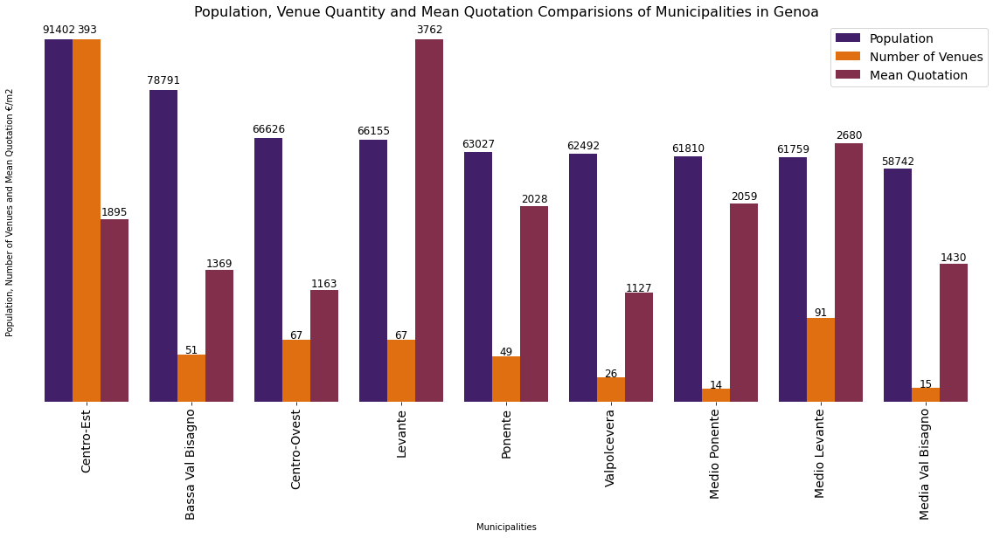

In [84]:
colorList = ['#421f69', '#e06f12', '#822f4b' ]

ax = df_summary_sorted[['Norm. Population', 'Norm. Num. of Venues', 'Norm. Mean Quotation']].plot(kind = 'bar', figsize = (20, 8), color = colorList, width = 0.8, edgecolor = None)

pop_ven_quo = list(df_summary_sorted['Population']) + list(df_summary_sorted['Number of Venues']) + list(df_summary_sorted['Mean Quotation €/m2 2019'])

plt.xticks(fontsize=14)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.yticks([])


plt.legend(labels = ['Population', 'Number of Venues', 'Mean Quotation'], fontsize = 14, loc = 'upper right')
plt.xlabel('Municipalities') # add to x-label to the plot
plt.ylabel('Population, Number of Venues and Mean Quotation €/m2') # add y-label to the plot
plt.title('Population, Venue Quantity and Mean Quotation Comparisions of Municipalities in Genoa', fontsize = 16) # add title to the plot

for p, pvq in zip(ax.patches, pop_ven_quo):
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax.annotate(pvq, (x + width/2, y + height*1.02), ha='center', fontsize = 12)

plt.show()

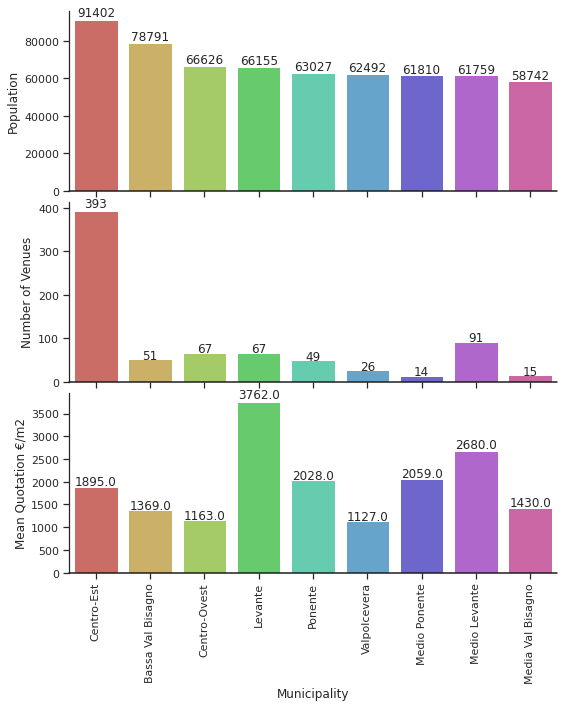

In [87]:
import seaborn as sns
sns.set(style="ticks", context="notebook")


df_summary_sorted = df_summary.sort_values(['Population'], ascending = False, axis = 0)
# Set up the matplotlib figure
f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 10), sharex=True)

x = df_summary_sorted['Municipality']
# Population in each municipality
sns.barplot(x=x, y=df_summary_sorted['Population'], palette="hls", ax=ax1)
ax1.axhline(0, color="k", clip_on=False)
ax1.set_ylabel("Population")
ax1.set_xlabel(None)


# Number of venues in each municipality
sns.barplot(x=x, y=df_summary_sorted['Number of Venues'], palette="hls", ax=ax2)
ax2.axhline(0, color="k", clip_on=False)
ax2.set_ylabel("Number of Venues")
ax2.set_xlabel(None)


# Mean quotation €/m2 (for year 2019)
sns.barplot(x=x, y=df_summary_sorted['Mean Quotation €/m2 2019'], palette="hls", ax=ax3)
ax3.axhline(0, color="k", clip_on=False)
ax3.set_ylabel("Mean Quotation €/m2")

# Finalize the plot
sns.despine(bottom=True)
ax3.tick_params(axis='x', rotation=90)
#plt.setp(f.axes)

for p in ax1.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax1.annotate(int(height), (x + width/2, y + height*1.02), ha='center', fontsize = 12)
    
for p in ax2.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax2.annotate(int(height), (x + width/2, y + height*1.02), ha='center', fontsize = 12)

for p in ax3.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy() 
    ax3.annotate(height, (x + width/2, y + height*1.02), ha='center', fontsize = 12)

plt.tight_layout(h_pad=0)

In the diagram above, each municipality has its own color for better comparison among the parameters. We can see how population, number of venues and mean quotation price per m2 vary in each municipality. Centro-Est having the most population and venues with a fair real estate price seems like a suitable place for opening up a business, especially during the pandemic where people are obliged to have take-aways instead of being seated in a restaurant. Opening up the business in a relatively densely populated area will increase the chances of increased revenue.

# Thank you

 -- Karan Singla
 
 Linkdin: https://www.linkedin.com/in/singla-karan